<a href="https://colab.research.google.com/github/CA683-Group99/Wind-Energy-Prediction/blob/main/4_IslandElectricityRandomForestModel_transformedTime.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

RESULTS PER OPTION:

- Latest:

      'hour', 'wdsp_BEL', 'wddir_BEL', 'wdsp', 'wddir', 'msl',
      'wdsp_COR', 'wddir_COR', 'wdsp_DUB', 'wddir_DUB', 
      'temp_DUB', 'radianTimeSin', 'radianTimeCos', 'TotalWindCapacityMW'
Eirgrid Wind Forecast Week MAE: 465.4 - RMSE: 672.9 - r2_score: 0.611

 RF Week MAE: 166.3 - RF Week RMSE: 247.1 - RF Week Train r2_score: 0.948

- Original 4_IslandElectricityRandomForestModel:

      'hour', 'isweekday', 'month', 'wdsp_BEL', 'wddir_BEL', 'temp_BEL',
       'wdsp', 'wddir', 'wdsp_COR', 'wddir_COR', 'wdsp_DUB', 'wddir_DUB',
       'temp_DUB', 'TotalWindCapacityMW'],


MAE: 272.26593735961364
RMSE: 360.6494999475853
Train r2_score: 0.8544186552101587

- radianTime instead of Month and Hour X_train.columns:
      'isweekday', 'wdsp_BEL', 'wddir_BEL', 'temp_BEL', 'wdsp', 'wddir',
      'wdsp_COR', 'wddir_COR', 'wdsp_DUB', 'wddir_DUB', 'temp_DUB',
      'radianTime', 'Day_inYear', 'TotalWindCapacityMW'

MAE: 292.7106431098383
RMSE: 381.47832078345976
Test r2_score: 0.8371173664337087

- With Day_inYear and hour:
      ['hour', 'isweekday', 'wdsp_BEL', 'wddir_BEL', 'temp_BEL', 'wdsp',
       'wddir', 'wdsp_COR', 'wddir_COR', 'wdsp_DUB', 'wddir_DUB', 'temp_DUB',
       'Day_inYear', 'TotalWindCapacityMW']
MAE: 272.65383788185085
RMSE: 358.0680549323199
Test r2_score: 0.8564952711814031


- Wind transformed option: 
      'date', 'hour', 'isweekday', 'wdsp_BELx', 'wdsp_BELy', 'temp_BEL',
       'wdspx', 'wdspy', 'wdsp_CORx', 'wdsp_CORy', 'wdsp_DUBx', 'wdsp_DUBy',
       'temp_DUB', 'Day_inYear', 'TotalWindCapacityMW', 'ActualWindMW',
       'ForecastWndMW', 'ActualDemandMW',
       
RF Week MAE: 265.3
RF Week RMSE: 328.0
RF Week Train r2_score: 0.9202757692338636


In [105]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import math

import io
import requests


from plotly.offline import iplot
import plotly.graph_objs as go
from plotly import tools
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

import warnings
warnings.filterwarnings('ignore')


from datetime import tzinfo, timedelta, datetime, date

# Any results you write to the current directory are saved as output.

import plotly.express as px
import seaborn as sns

import os

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt

import tensorflow as tf

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

# Load feature vector


In [106]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [107]:
import os
os.chdir('/content/drive/MyDrive/Github/Wind-Energy-Prediction')
!ls "Data/"

 EirGrid
 forecast
 IrelandElectricity2020.csv
 IrelandWeatherData.csv
 IslandElectricity2017_2020v3.csv
 IslandElectricity2017_2020v4.csv
 IslandElectricity2020.csv
 IslandElectricityOnly2017_2020v3Clean.csv
 IslandElectricityOnly2017_2020v3.csv
 Readme.txt
 seai_Electricity_Monthly_Timeseries.csv
'System-and-Renewable-Data-Summary-Report (9).xlsx'
'WindInstalledCapacities_MW_Monthly - Sheet1.csv'


In [108]:
fileP = 'Data/IslandElectricity2017_2020v4.csv'
newdf = pd.read_csv(fileP, parse_dates=[1], na_values=" ")

latestWindCapacityMW = newdf['TotalWindCapacityMW'].max()

In [109]:
latestWindCapacityMW

5576.095

In [110]:
# Cut off dates
cutOffValidationDate = "2021-08-31"
cutOffTestDate = "2021-09-15"
max_date = "2021-09-30"


In [111]:
#Krystian: Looking for maximal extreme values
print('-----------DATA SIZE -------------')
print(newdf.shape)           # 10 Columns, 35044 rows
count_row = newdf.shape[0]   # 10 Columns
count_col = newdf.shape[1]   # 35044 rows
print('Rows: ', count_row, ', Columns: ', count_col)

print('-----------DATA INFO -------------')
print(newdf.info())

print('-----------DATA MAX Values -------------')
newdf.max()

print('-----------DATA COLUMNS-------------')
columns = newdf.columns.values.tolist()
print (columns)

print('-----------BASIC STATISTICS-------------')
newdf.describe()

-----------DATA SIZE -------------
(37272, 77)
Rows:  37272 , Columns:  77
-----------DATA INFO -------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37272 entries, 0 to 37271
Data columns (total 77 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Unnamed: 0           37272 non-null  int64         
 1   date                 37272 non-null  datetime64[ns]
 2   rain_BEL             37272 non-null  float64       
 3   temp_BEL             37272 non-null  float64       
 4   wetb_BEL             37272 non-null  float64       
 5   dewpt_BEL            37272 non-null  float64       
 6   vappr_BEL            37272 non-null  float64       
 7   rhum_BEL             37272 non-null  int64         
 8   msl_BEL              37272 non-null  float64       
 9   wdsp_BEL             37272 non-null  int64         
 10  wddir_BEL            37272 non-null  int64         
 11  rain_DUB             37272 non-null

,Unnamed: 0,rain_BEL,temp_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,wdsp_BEL,wddir_BEL,rain_DUB,temp_DUB,wetb_DUB,dewpt_DUB,vappr_DUB,rhum_DUB,msl_DUB,wdsp_DUB,wddir_DUB,ww_DUB,w_DUB,sun_DUB,vis_DUB,clht_DUB,clamt_DUB,rain,temp,wetb,dewpt,vappr,rhum,msl,wdsp,wddir,ww,w,sun,vis,clht,clamt,rain_COR,temp_COR,wetb_COR,dewpt_COR,vappr_COR,rhum_COR,msl_COR,wdsp_COR,wddir_COR,ww_COR,w_COR,sun_COR,vis_COR,clht_COR,clamt_COR,rain_MAL,temp_MAL,wetb_MAL,dewpt_MAL,vappr_MAL,rhum_MAL,msl_MAL,wdsp_MAL,wddir_MAL,Unnamed: 0.1,ActualDemandMW,ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,WindMWPercent,hour,month,year,TotalWindCapacityMW
count,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000
mean,18635.500000,0.157300,10.618674,9.205886,7.621185,10.850252,82.022269,1011.809101,11.927640,199.158081,0.086118,10.074348,8.552804,6.881541,10.384012,81.704041,1013.221000,9.543035,206.179438,14.682630,29.186869,0.170817,27865.902018,290.168464,5.603348,0.124010,10.905709,9.183942,7.709951,10.946289,81.832824,1013.383967,8.948943,192.825177,17.602597,34.945562,0.161118,22475.402447,281.441457,5.664386,0.146040,10.242823,8.913672,7.749761,10.986869,85.580409,1014.043389,9.735888,213.675681,16.904432,32.343234,0.176028,28351.560421,285.479287,5.573997,0.134146,10.231836,8.816310,7.182990,10.537226,81.483848,1011.319076,14.705543,200.306128,18635.500000,4214.501355,1366.772088,1321.031867,4215.939526,31.475256,31.716800,11.500000,6.609788,2019.115261,5087.728742
std,10759.643953,0.504987,4.060498,3.859106,4.311770,3.108119,11.139185,13.212241,6.631433,94.261210,0.415485,5.158264,4.565245,4.640796,3.247198,12.211361,12.518678,4.743138,82.451139,22.655528,26.770316,0.325372,13475.748282,401.964234,2.250963,0.470935,4.950450,5.336506,4.464907,3.266084,12.290287,12.505230,5.193598,88.152814,23.462417,29.045255,0.320146,12674.049508,409.170134,2.425188,0.552522,4.664708,5.135210,4.526060,3.291675,12.232191,12.172883,5.104331,84.964048,23.289384,27.825523,0.336610,17980.663633,418.477794,2.391584,0.477736,3.946048,3.840811,4.331365,3.055400,9.895307,13.293352,7.293947,87.411908,10759.643953,831.706221,1087.036447,985.505163,754.167759,530.157222,23.147838,6.922279,3.368733,1.278490,459.259428
min,0.000000,0.000000,-3.300000,-4.400000,-9.700000,2.900000,24.000000,959.100000,0.000000,10.000000,0.000000,-5.600000,-49.900000,-8.900000,3.100000,24.000000,965.900000,0.000000,0.000000,1.000000,0.000000,0.000000,100.000000,1.000000,0.000000,0.000000,-4.800000,-49.000000,-8.300000,3.300000,24.000000,967.300000,0.000000,0.000000,1.000000,0.000000,0.000000,100.000000,1.000000,0.000000,0.000000,-6.900000,-49.000000,-9.200000,3.100000,26.000000,970.100000,0.000000,0.000000,1.000000,0.000000,0.000000,15.000000,1.000000,0.000000,0.000000,-2.000000,-3.000000,-7.900000,3.400000,20.000000,956.600000,1.000000,10.000000,0.000000,2394.750000,0.000000,-44.750000,1939.250000,-1415.000000,-0.943098,0.000000,1.000000,2017.000000,4096.494000
25%,9317.750000,0.000000,7.800000,6.400000,4.400000,8.400000,75.000000,1003.400000,7.000000,140.000000,0.000000,6.400000

In [112]:
newdf[newdf.wdsp_DUB.isnull()== True]

,Unnamed: 0,date,rain_BEL,temp_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,wdsp_BEL,wddir_BEL,rain_DUB,temp_DUB,wetb_DUB,dewpt_DUB,vappr_DUB,rhum_DUB,msl_DUB,wdsp_DUB,wddir_DUB,ww_DUB,w_DUB,sun_DUB,vis_DUB,clht_DUB,clamt_DUB,rain,temp,wetb,dewpt,vappr,rhum,msl,wdsp,wddir,ww,w,sun,vis,clht,clamt,rain_COR,temp_COR,wetb_COR,dewpt_COR,vappr_COR,rhum_COR,msl_COR,wdsp_COR,wddir_COR,ww_COR,w_COR,sun_COR,vis_COR,clht_COR,clamt_COR,rain_MAL,temp_MAL,wetb_MAL,dewpt_MAL,vappr_MAL,rhum_MAL,msl_MAL,wdsp_MAL,wddir_MAL,Unnamed: 0.1,ActualDemandMW,ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,WindMWPercent,hour,isweekday,month,year,TotalWindCapacityMW


In [113]:
import plotly.express as px

fig = px.scatter(newdf, x='date', y='ActualDemandMW')
fig.show()

In [114]:
eirgridCols = ['ActualDemandMW', 'ActualGenerationMW' , 'ForecastWndMW' , 'ActualWindMW', 'NetTotal_MW' ]
len(eirgridCols)

5

In [115]:
#newdf = newdf.loc[newdf['month'].isnull() == False]

In [116]:
newdf['WindGenPercent'] = (newdf['ActualWindMW'] / newdf['ActualGenerationMW']) * 100
fig = px.scatter(newdf, x='hour', y='WindGenPercent', facet_col='year')
fig.show()

In [117]:
inData = newdf
inData.isweekday = inData.isweekday.astype('bool')

## Transform wind speed and dir

In [118]:
newdf.date

0       2017-07-01 00:00:00
1       2017-07-01 01:00:00
2       2017-07-01 02:00:00
3       2017-07-01 03:00:00
4       2017-07-01 04:00:00
                ...        
37267   2021-09-30 19:00:00
37268   2021-09-30 20:00:00
37269   2021-09-30 21:00:00
37270   2021-09-30 22:00:00
37271   2021-09-30 23:00:00
Name: date, Length: 37272, dtype: datetime64[ns]

In [119]:
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Wind"))

recentdf = newdf[(newdf.date > "2021-02-24") & (newdf.date < "2021-03-24")]
fig.add_trace(go.Scatter(x=recentdf['date'], y=recentdf.wdsp,
                    mode='lines',
                    name='Wind Speed (kn)',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=recentdf['date'], y=recentdf.wddir,
                    mode='lines',
                    name='Wind dir (degree)',showlegend=True), 1, 1, secondary_y=True)

fig.show()

In [120]:
import math

suffixes = ['_COR', '_DUB', '_BEL', '', '_MAL']
def transformWindInto2d(df):
  for suf in suffixes:
    df['wind' + suf + 'sin'] = None
    df['wind' + suf + 'cos'] = None

  def transformWindInto2dRow(row):
    for suf in suffixes:
      row['wind' + suf + 'sin'] = row['wdsp'+ suf] * math.sin(row['wddir' + suf])
      row['wind' + suf + 'cos'] = row['wdsp'+ suf] * math.cos(row['wddir' + suf])
    return row

  df = df.apply(transformWindInto2dRow, axis='columns')
  return df

inData = transformWindInto2d(inData)
inData.columns

Index(['Unnamed: 0', 'date', 'rain_BEL', 'temp_BEL', 'wetb_BEL', 'dewpt_BEL',
       'vappr_BEL', 'rhum_BEL', 'msl_BEL', 'wdsp_BEL', 'wddir_BEL', 'rain_DUB',
       'temp_DUB', 'wetb_DUB', 'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB',
       'wdsp_DUB', 'wddir_DUB', 'ww_DUB', 'w_DUB', 'sun_DUB', 'vis_DUB',
       'clht_DUB', 'clamt_DUB', 'rain', 'temp', 'wetb', 'dewpt', 'vappr',
       'rhum', 'msl', 'wdsp', 'wddir', 'ww', 'w', 'sun', 'vis', 'clht',
       'clamt', 'rain_COR', 'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR',
       'rhum_COR', 'msl_COR', 'wdsp_COR', 'wddir_COR', 'ww_COR', 'w_COR',
       'sun_COR', 'vis_COR', 'clht_COR', 'clamt_COR', 'rain_MAL', 'temp_MAL',
       'wetb_MAL', 'dewpt_MAL', 'vappr_MAL', 'rhum_MAL', 'msl_MAL', 'wdsp_MAL',
       'wddir_MAL', 'Unnamed: 0.1', 'ActualDemandMW', 'ForecastWndMW',
       'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW', 'WindMWPercent',
       'hour', 'isweekday', 'month', 'year', 'TotalWindCapacityMW',
       'WindGenPe

In [121]:
inData[['wind_CORsin', 'wind_CORcos']].describe()

,wind_CORsin,wind_CORcos
count,37272.000000,37272.000000
mean,-0.781777,-0.838439
std,7.577868,7.880735
min,-33.991699,-41.952060
25%,-5.719011,-6.301568
50%,-1.602305,-0.265159
75%,4.506443,4.488903
max,34.308388,32.870811


In [122]:

recentdf = inData[inData.date > "2021-02-24"]

fig = px.scatter(x=inData['wind_CORsin'], y=inData.wind_CORcos)
#fig = px.scatter(x=recentdf['windsin'], y=recentdf.windcos)
fig.update_layout(autosize=False, width=500, height=500)
fig.show()

(-46.585344938006656, 44.1101232770581, -40.275433395669715, 44.82383268922747)

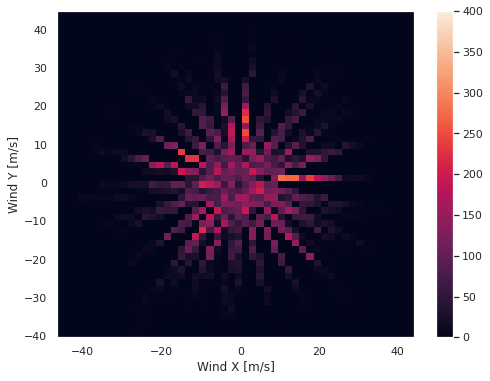

In [123]:
plt.hist2d(inData['wind_MALsin'], inData['wind_MALcos'], bins=(50, 50), vmax=400)
plt.colorbar()
plt.xlabel('Wind X [m/s]')
plt.ylabel('Wind Y [m/s]')
ax = plt.gca()
ax.axis('tight')

## Transform time into 2D

Intend to capture the seasonal pattern

In [124]:
def old_transformTimeInto2d(df):
  timestamp_s = df.date.map(datetime.timestamp)
  day = 24*60*60
  year = (365.2425)*day

  df['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
  df['Day cos'] = np.cos(timestamp_s * (2 * np.pi / day))
  df['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))
  df['Year cos'] = np.cos(timestamp_s * (2 * np.pi / year))

  return df

In [125]:
import numpy as np
import math

def transformTimeInto2d(df):
  df['Day_inYear'] = None
  df['daysInYear'] = None
  df['radianTime'] = None
  df['radianTimeCos'] = None
  df['radianTimeSin'] = None
  df['hourCos'] = None  # newly added radian
  df['hourSin'] = None

  def check_leap(year):
    if year%4 == 0:
      return 366
    else:
      return 365

  def transformTimeInto2dRow(row):
    row['Day_inYear'] = row['date'].timetuple().tm_yday
    daysInYear = check_leap(row['year'])
    row['daysInYear'] = daysInYear
    row['radianTime'] = (row.hour + row.Day_inYear * 24 ) / (24 * daysInYear) * (2*np.pi)
    row['radianTimeCos'] = math.cos(row['radianTime'])
    row['radianTimeSin'] = math.sin(row['radianTime'])
    row['hourCos'] = math.cos(row.hour/24 * (2*np.pi))
    row['hourSin'] = math.sin(row.hour/24 * (2*np.pi))
    return row

  df = df.apply(transformTimeInto2dRow, axis='columns')
  return df

inData = transformTimeInto2d(inData)
inData.columns

Index(['Unnamed: 0', 'date', 'rain_BEL', 'temp_BEL', 'wetb_BEL', 'dewpt_BEL',
       'vappr_BEL', 'rhum_BEL', 'msl_BEL', 'wdsp_BEL', 'wddir_BEL', 'rain_DUB',
       'temp_DUB', 'wetb_DUB', 'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB',
       'wdsp_DUB', 'wddir_DUB', 'ww_DUB', 'w_DUB', 'sun_DUB', 'vis_DUB',
       'clht_DUB', 'clamt_DUB', 'rain', 'temp', 'wetb', 'dewpt', 'vappr',
       'rhum', 'msl', 'wdsp', 'wddir', 'ww', 'w', 'sun', 'vis', 'clht',
       'clamt', 'rain_COR', 'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR',
       'rhum_COR', 'msl_COR', 'wdsp_COR', 'wddir_COR', 'ww_COR', 'w_COR',
       'sun_COR', 'vis_COR', 'clht_COR', 'clamt_COR', 'rain_MAL', 'temp_MAL',
       'wetb_MAL', 'dewpt_MAL', 'vappr_MAL', 'rhum_MAL', 'msl_MAL', 'wdsp_MAL',
       'wddir_MAL', 'Unnamed: 0.1', 'ActualDemandMW', 'ForecastWndMW',
       'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW', 'WindMWPercent',
       'hour', 'isweekday', 'month', 'year', 'TotalWindCapacityMW',
       'WindGenPe

Text(0.5, 1.0, 'Radian time signal')

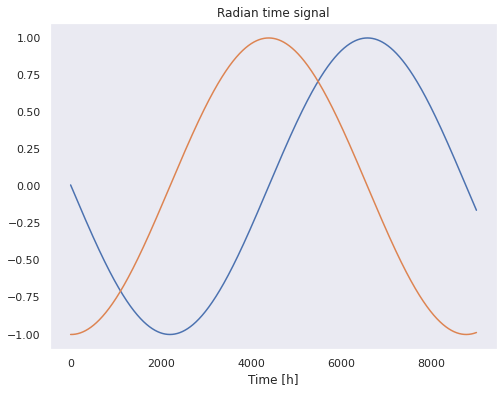

In [126]:
plt.plot(np.array(inData['radianTimeSin'])[:(24*375)])
plt.plot(np.array(inData['radianTimeCos'])[:(24*375)])
plt.xlabel('Time [h]')
plt.title('Radian time signal')

In [127]:
fig = px.scatter(inData, x='Day_inYear', y='ActualWindMW', color='year')
fig.show()

# Prep smaller dataset to run model : reduced dataset for prototype to known important factors

In [128]:
#OLD
#redds = newdf.loc[:, ['date', 'Year sin', 'Year cos',  'Day sin', 'Day cos', 'isweekday',
#                     'wdsp_BELx', 'wdsp_BELy', 'temp_BEL',
#                      'wdspx', 'wdspy','temp',
#                      'wdsp_CORx', 'wdsp_CORy', 'temp_COR',
#                      'wdsp_DUBx', 'wdsp_DUBy', 'temp_DUB', 
#                      'TotalWindCapacityMW', 'ActualWindMW', 'ForecastWndMW', 'ActualDemandMW']]

In [129]:
attrs = ['date', 'hour', 'month', 'year', 'Day_inYear',
          'wdsp_BEL', 'wddir_BEL', 'wind_BELsin', 'wind_BELcos','vappr_BEL', 'rhum_BEL', 'temp_BEL',
          'wdsp', 'wddir', 'windsin', 'windcos', 'vappr', 'rhum', 'temp', 'msl',
          'wdsp_COR', 'wddir_COR', 'wind_CORsin', 'wind_CORcos', 'vappr_COR', 'rhum_COR', 'temp_COR',
          'wdsp_DUB', 'wddir_DUB', 'wind_DUBsin', 'wind_DUBcos', 'vappr_DUB', 'rhum_DUB', 'temp_DUB',
          'wdsp_MAL', 'wddir_MAL', 'wind_MALsin', 'wind_MALcos', 'vappr_MAL', 'rhum_MAL', 'temp_MAL',
          'TotalWindCapacityMW',
          'radianTimeSin', 'radianTimeCos', 'hourSin', 'hourCos',
          'ActualWindMW', 'ActualDemandMW', 'ForecastWndMW']

dataSet = inData.loc[(inData.year>=2017) & (inData.date < max_date), attrs]

## Handle the rows with empty values

In [130]:
# CL Change : No missing data :=)
dataSet.isnull().sum()

date                   0
hour                   0
month                  0
year                   0
Day_inYear             0
wdsp_BEL               0
wddir_BEL              0
wind_BELsin            0
wind_BELcos            0
vappr_BEL              0
rhum_BEL               0
temp_BEL               0
wdsp                   0
wddir                  0
windsin                0
windcos                0
vappr                  0
rhum                   0
temp                   0
msl                    0
wdsp_COR               0
wddir_COR              0
wind_CORsin            0
wind_CORcos            0
vappr_COR              0
rhum_COR               0
temp_COR               0
wdsp_DUB               0
wddir_DUB              0
wind_DUBsin            0
wind_DUBcos            0
vappr_DUB              0
rhum_DUB               0
temp_DUB               0
wdsp_MAL               0
wddir_MAL              0
wind_MALsin            0
wind_MALcos            0
vappr_MAL              0
rhum_MAL               0


In [131]:
#dataSet.fillna(method='ffill', inplace=True)

In [132]:
# Remove the rows with empty cells
import numpy as np
eIdx = np.where(pd.isnull(dataSet))
print(eIdx[0])

print(dataSet.shape)
dataSet = dataSet.drop(eIdx[0], axis=0)
print(dataSet.shape)

[]
(37248, 49)
(37248, 49)


## Different feature sets to build different ANN models

In [133]:
# CL: 2021/04/02: remove Month as very highly correlated with Day_inYear, as well as temp other than temp_DUB
# and add 'msl' Sea Level pressure as highly predictive of upcoming storm and improve wind turbine performance
# KP: added 'hourSin', 'hourCos'
attr_basic_month = ['hour', 'month', 
              'wdsp_BEL', 'wddir_BEL', 
              'wdsp', 'wddir', 'msl',
              'wdsp_COR', 'wddir_COR',
              'wdsp_DUB', 'wddir_DUB', 'temp_DUB',
              'wdsp_MAL', 'wddir_MAL',
              'TotalWindCapacityMW']

attr_basic = ['hour', 'Day_inYear',
              'wdsp_BEL', 'wddir_BEL', 
              'wdsp', 'wddir', 'msl',
              'wdsp_COR', 'wddir_COR',
              'wdsp_DUB', 'wddir_DUB', 'temp_DUB',
              'wdsp_MAL', 'wddir_MAL',
              'TotalWindCapacityMW']

attr_rhum = ['hour', 'Day_inYear',
              'wdsp_BEL', 'wddir_BEL', 'rhum', 
              'wdsp', 'wddir', 'rhum', 'msl',
              'wdsp_COR', 'wddir_COR', 'rhum_COR',
              'wdsp_DUB', 'wddir_DUB', 'rhum_DUB', 'temp_DUB',
              'wdsp_MAL', 'wddir_MAL',
              'TotalWindCapacityMW']

attr_vappr = ['hour', 'Day_inYear',
              'wdsp_BEL', 'wddir_BEL', 'vappr_BEL', 
              'wdsp', 'wddir', 'vappr','msl', 'msl',
              'wdsp_COR', 'wddir_COR', 'vappr_COR',
              'wdsp_DUB', 'wddir_DUB', 'vappr_DUB', 'temp_DUB',
              'wdsp_MAL', 'wddir_MAL',
              'TotalWindCapacityMW']

attr_rhum_vappr = ['hour', 'Day_inYear',
                    'wdsp_BEL', 'wddir_BEL', 'rhum', 'vappr_BEL', 
                    'wdsp', 'wddir', 'rhum', 'vappr', 'msl',
                    'wdsp_COR', 'wddir_COR', 'rhum_COR', 'vappr_COR',
                    'wdsp_DUB', 'wddir_DUB', 'rhum_DUB', 'vappr_DUB', 'temp_DUB',
                    'wdsp_MAL', 'wddir_MAL',
                    'TotalWindCapacityMW']

attr_2D_wind = ['hour', 'Day_inYear',
                'wind_BELsin', 'wind_BELcos', 
                'windsin', 'windcos', 'msl',
                'wind_CORsin', 'wind_CORcos',
                'wind_DUBsin', 'wind_DUBcos', 'temp_DUB',
                'wind_MALsin', 'wind_MALcos',
                'TotalWindCapacityMW']

attr_radianTime = ['wdsp_BEL', 'wddir_BEL', 
                    'wdsp', 'wddir', 'msl',
                    'wdsp_COR', 'wddir_COR',
                    'wdsp_DUB', 'wddir_DUB', 'temp_DUB',
                    'wdsp_MAL', 'wddir_MAL',
                    'radianTimeSin', 'radianTimeCos', 'hourSin', 'hourCos',
                    'TotalWindCapacityMW']

attr_2D_wind_time = ['wind_BELsin', 'wind_BELcos', 
                      'windsin', 'windcos', 'msl',
                      'wind_CORsin', 'wind_CORcos', 
                      'wind_DUBsin', 'wind_DUBcos', 'temp_DUB', 
                      'wind_MALsin', 'wind_MALcos',
                      'radianTimeSin', 'radianTimeCos', 'hourSin', 'hourCos',
                      'TotalWindCapacityMW']


attr_rhum_time = ['wdsp_BEL', 'wddir_BEL', 'rhum_BEL',
                  'wdsp', 'wddir', 'rhum',
                  'wdsp_COR', 'wddir_COR', 'rhum_COR',
                  'wdsp_DUB', 'wddir_DUB', 'rhum_DUB', 'temp_DUB',
                  'radianTimeSin', 'radianTimeCos', 'hourSin', 'hourCos',
                  'wdsp_MAL', 'wddir_MAL', 'rhum_MAL',
                  'TotalWindCapacityMW']


attr_selections = [attr_basic_month, attr_basic, attr_rhum, attr_2D_wind, attr_radianTime, attr_2D_wind_time, attr_rhum_time]
attrSet_names = ['basic month', 'basic', 'rhum', 'wind', 'radianTime', 'wind & time', 'time & rhum']

#attr_selections = [attr_basic, attr_rhum, attr_msl, attr_rhum_msl, attr_2D_wind, attr_radianTime, attr_2D_wind_time, attr_rhum_time]
#attrSet_names = ['basic', 'rhum', 'msl', 'rhum & msl', 'wind', 'radianTime', 'wind & time', 'time & rhum']


## Correlation matrix and VIF


### Basic subset

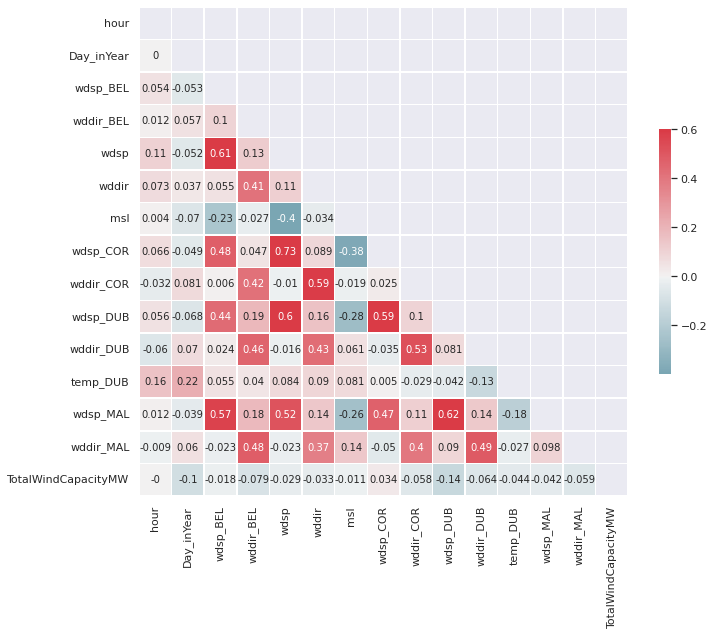

In [134]:
import seaborn as sns

num_df = dataSet.loc[:, attr_basic].select_dtypes(['int', 'float'])
# Compute the correlation matrix
corr = num_df.corr()
corr = np.round(corr, 3)
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=0.6, center=0, annot= True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})


In [135]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices
from statsmodels.api import add_constant

num_df = add_constant(num_df)

vif = [variance_inflation_factor(num_df.to_numpy(), i) for i in range(num_df.to_numpy().shape[1])]

pd.DataFrame(num_df.iloc[:, 1:].columns, vif[1:])

,0
1.046718,hour
1.115458,Day_inYear
1.926657,wdsp_BEL
1.583299,wddir_BEL
3.032295,wdsp
1.740666,wddir
1.299197,msl
2.468290,wdsp_COR
1.870674,wddir_COR
2.243801,wdsp_DUB


### RadianTime subset

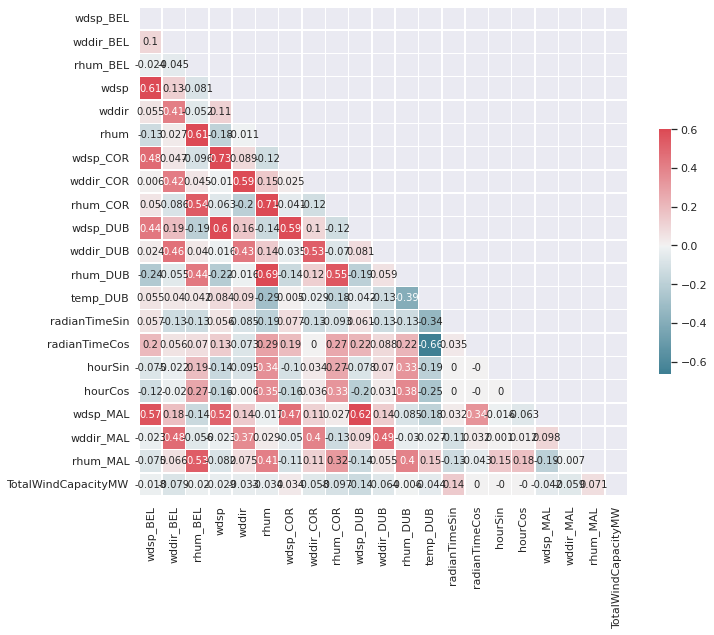

In [136]:
num_df = dataSet.loc[:, attr_rhum_time].select_dtypes(['int', 'float'])
# Compute the correlation matrix
corr = num_df.corr()
corr = np.round(corr, 3)
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=0.6, center=0, annot= True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [137]:
num_df = add_constant(num_df)

vif = [variance_inflation_factor(num_df.to_numpy(), i) for i in range(num_df.to_numpy().shape[1])]

pd.DataFrame(num_df.iloc[:, 1:].columns, vif[1:])

,0
2.127298,wdsp_BEL
1.613789,wddir_BEL
2.173512,rhum_BEL
2.961876,wdsp
1.785259,wddir
3.688000,rhum
2.478668,wdsp_COR
1.976647,wddir_COR
2.791833,rhum_COR
2.355079,wdsp_DUB


### attr_2D_wind_time subset

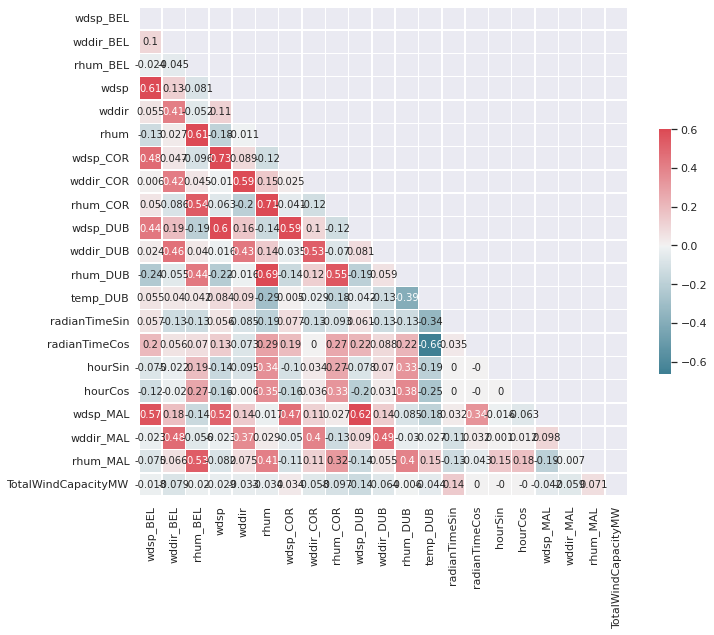

In [138]:

num_df = dataSet.loc[:, attr_rhum_time].select_dtypes(['int', 'float'])
# Compute the correlation matrix
corr = num_df.corr()
corr = np.round(corr, 3)
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=0.6, center=0, annot= True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [139]:
num_df = add_constant(num_df)

vif = [variance_inflation_factor(num_df.to_numpy(), i) for i in range(num_df.to_numpy().shape[1])]

pd.DataFrame(num_df.iloc[:, 1:].columns, vif[1:])

,0
2.127298,wdsp_BEL
1.613789,wddir_BEL
2.173512,rhum_BEL
2.961876,wdsp
1.785259,wddir
3.688000,rhum
2.478668,wdsp_COR
1.976647,wddir_COR
2.791833,rhum_COR
2.355079,wdsp_DUB


## Hours where wind generation over 70% of demand

In [140]:
dataSet.columns

Index(['date', 'hour', 'month', 'year', 'Day_inYear', 'wdsp_BEL', 'wddir_BEL',
       'wind_BELsin', 'wind_BELcos', 'vappr_BEL', 'rhum_BEL', 'temp_BEL',
       'wdsp', 'wddir', 'windsin', 'windcos', 'vappr', 'rhum', 'temp', 'msl',
       'wdsp_COR', 'wddir_COR', 'wind_CORsin', 'wind_CORcos', 'vappr_COR',
       'rhum_COR', 'temp_COR', 'wdsp_DUB', 'wddir_DUB', 'wind_DUBsin',
       'wind_DUBcos', 'vappr_DUB', 'rhum_DUB', 'temp_DUB', 'wdsp_MAL',
       'wddir_MAL', 'wind_MALsin', 'wind_MALcos', 'vappr_MAL', 'rhum_MAL',
       'temp_MAL', 'TotalWindCapacityMW', 'radianTimeSin', 'radianTimeCos',
       'hourSin', 'hourCos', 'ActualWindMW', 'ActualDemandMW',
       'ForecastWndMW'],
      dtype='object')

In [141]:
dataSet["over70percent"] = 0

def over70percentmap(row):
  if (row.ActualWindMW > (0.7 * row.ActualDemandMW)):
    row.over70percent = 1
  return row
dataSet = dataSet.apply(over70percentmap, axis='columns')

#dataSet.over70percent.map(lambda p: 0 if (dataSet.ActualDemandMW < (0.7 * dataSet.ActualDemandMW) == True) else 1 )

In [142]:
dataSet["weekly_over70percent"] = dataSet.over70percent.rolling(7*24).mean()

In [143]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Wind"))



#fig.add_trace(go.Scatter(x=dataSet['date'], y=(0.7*dataSet['ActualDemandMW']),
#                         line=dict(color='firebrick', width=1, dash='dash'), # dash options include 'dash', 'dot', and 'dashdot'
#                    name='70% Actual Demand',showlegend=True), 1, 1, secondary_y=False)


fig.add_trace(go.Scatter(x=dataSet['date'], y=dataSet['weekly_over70percent'],
                    mode='lines',
                    name='over70percent',showlegend=True), 1, 1, secondary_y=True)

fig.update_layout(
    title_text="Wind Generation (%)",
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=1000,
    height=500
)
fig.show()

# Training, Validation & Test set

In [144]:
dataSet.shape

(37248, 51)

In [145]:
dataSet.tail()

,date,hour,month,year,Day_inYear,wdsp_BEL,wddir_BEL,wind_BELsin,wind_BELcos,vappr_BEL,rhum_BEL,temp_BEL,wdsp,wddir,windsin,windcos,vappr,rhum,temp,msl,wdsp_COR,wddir_COR,wind_CORsin,wind_CORcos,vappr_COR,rhum_COR,temp_COR,wdsp_DUB,wddir_DUB,wind_DUBsin,wind_DUBcos,vappr_DUB,rhum_DUB,temp_DUB,wdsp_MAL,wddir_MAL,wind_MALsin,wind_MALcos,vappr_MAL,rhum_MAL,temp_MAL,TotalWindCapacityMW,radianTimeSin,radianTimeCos,hourSin,hourCos,ActualWindMW,ActualDemandMW,ForecastWndMW,over70percent,weekly_over70percent
37243,2021-09-29 19:00:00,19.0,9.0,2021.0,272,23,190,22.949383,1.525058,12.5,90,11.8,10,160,2.194253,-9.756293,11.2,85,11.1,1021.6,6,190,5.986796,0.397841,11.1,83,11.3,7,210,3.274030,-6.187142,9.0,71,10.5,9,170.0,3.119845,8.441953,9.2,76,9.6,5576.095,-0.999864,-0.016496,-0.965926,0.258819,1797.5,5345.25,1562.75,0,0.059524
37244,2021-09-29 20:00:00,20.0,9.0,2021.0,272,25,180,-20.028816,-14.961502,13.0,89,12.6,10,140,9.802397,-1.978136,11.6,90,10.8,1021.0,9,190,8.980194,0.596762,11.6,85,11.6,7,200,-6.113081,3.410314,9.1,70,10.8,11,160.0,2.413678,-10.731922,9.4,78,9.6,5576.095,-0.999876,-0.015779,-0.866025,0.500000,2428.5,5238.50,1954.25,0,0.059524
37245,2021-09-29 21:00:00,21.0,9.0,2021.0,272,31,190,30.931778,2.055513,13.3,89,13.0,9,140,8.822157,-1.780322,12.0,91,11.0,1020.0,10,190,9.977993,0.663069,12.0,86,12.0,7,200,-6.113081,3.410314,9.6,76,10.5,15,170.0,5.199742,14.069921,9.4,74,10.3,5576.095,-0.999887,-0.015062,-0.707107,0.707107,2771.0,4795.50,2461.50,0,0.059524
37246,2021-09-29 22:00:00,22.0,9.0,2021.0,272,31,190,30.931778,2.055513,14.4,93,13.4,9,140,8.822157,-1.780322,12.4,93,11.3,1018.6,12,190,11.973591,0.795682,12.4,84,12.8,8,200,-6.986378,3.897501,9.4,74,10.6,16,160.0,3.510804,-15.610069,10.0,83,9.6,5576.095,-0.999897,-0.014345,-0.500000,0.866025,2949.0,4286.50,3001.75,0,0.059524
37247,2021-09-29 23:00:00,23.0,9.0,2021.0,272,33,200,-28.818811,16.077193,15.2,96,13.7,13,150,-9.293394,9.090260,13.1,93,12.1,1017.0,13,190,12.971391,0.861989,13.2,93,12.2,9,200,-7.859676,4.384689,10.7,85,10.5,19,160.0,4.169080,-18.536957,10.3,86,9.6,5576.095,-0.999907,-0.013627,-0.258819,0.965926,3034.0,3813.00,3475.00,1,0.065476


In [146]:
from sklearn.model_selection import train_test_split
import numpy as np

splitOption = 1 # split per day of the month


testSet = dataSet.loc[(inData.date > cutOffTestDate), :]
mainSet = dataSet.loc[(inData.date <= cutOffTestDate), :]

if (splitOption == 0):
  trainSet, validSet = train_test_split(mainSet, test_size=0.2, random_state=42)
elif (splitOption == 1):  # split per day of the month
  dataSet["dayInMonth"] = 0

  def setDayInMonth(row):
      row["dayInMonth"] = row.date.day
      return row

  dataSet = dataSet.apply(setDayInMonth, axis=1)

  trainSet = dataSet.loc[(dataSet.dayInMonth > 0) & (dataSet.dayInMonth < 23), :]
  validSet = dataSet.loc[(dataSet.dayInMonth >= 23) & (inData.date <= cutOffTestDate), :]
elif (splitOption == 2):  # split per period
  trainSet = dataSet.loc[(inData.date <= cutOffValidationDate), :]
  validSet = dataSet.loc[(inData.date > cutOffValidationDate), :]  
else:
  monthYear = []
  for y in range(2017,2021):
    for m in range(1,13):
     monthYear.append([m, y])
  trainDate, validDate = train_test_split(monthYear, test_size=0.2, random_state=42)

  trainDate = np.array(trainDate)
  validDate = np.array(validDate)

  trainSet = dataSet.loc[(dataSet.month in trainDate[:,0]) & (dataSet.year in trainDate[:,1]), :]
  validSet = dataSet.loc[(dataSet.month in validDate[:,0]) & (dataSet.year in validDate[:,1]), :]

y_train = trainSet.ActualWindMW
y_valid = validSet.ActualWindMW
y_test = testSet.ActualWindMW

In [147]:
trainSet.shape, validSet.shape, testSet.shape

((26928, 52), (10152, 52), (359, 51))

# run Random Forest For chosen subset (defined in attrSet var)

In [148]:
attrSet_names

['basic month',
 'basic',
 'rhum',
 'wind',
 'radianTime',
 'wind & time',
 'time & rhum']

In [149]:
attrSet = attr_rhum_time
attrSet_name = 'time & rhum'

In [150]:
attrSet_name

'time & rhum'

In [151]:
from sklearn.model_selection import train_test_split

X_train_full = trainSet.loc[:, attrSet]
X_valid_full = validSet.loc[:, attrSet]
X_test_full = testSet.loc[:, attrSet]


# "Cardinality" means the number of unique values in a column
# Select categorical columns with relatively low cardinality (convenient but arbitrary)
categorical_cols = [cname for cname in X_train_full.columns if
                    X_train_full[cname].nunique() < 10 and 
                    X_train_full[cname].dtype == "object"]

# Select numerical columns
numerical_cols = [cname for cname in X_train_full.columns if 
                X_train_full[cname].dtype in ['int64', 'float64', 'bool']]

# Keep selected columns only
my_cols = categorical_cols + numerical_cols
X_train = X_train_full[my_cols].copy()
X_valid = X_valid_full[my_cols].copy()


In [152]:
X_train_full.shape, X_valid_full.shape

((26928, 21), (10152, 21))

In [153]:
y_train.shape , X_train.shape, y_valid.shape, X_valid.shape

((26928,), (26928, 21), (10152,), (10152, 21))

In [154]:
X_train.columns

Index(['wdsp_BEL', 'wddir_BEL', 'rhum_BEL', 'wdsp', 'wddir', 'rhum',
       'wdsp_COR', 'wddir_COR', 'rhum_COR', 'wdsp_DUB', 'wddir_DUB',
       'rhum_DUB', 'temp_DUB', 'radianTimeSin', 'radianTimeCos', 'hourSin',
       'hourCos', 'wdsp_MAL', 'wddir_MAL', 'rhum_MAL', 'TotalWindCapacityMW'],
      dtype='object')

## Run model with Performance metrics :  mean_absolute_error, mean_squared_error, r2_score

In [155]:
#from sklearn.metrics import mean_absolute_percentage_error

In [156]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestRegressor

# Preprocessing for numerical data
numerical_transformer = SimpleImputer(strategy='constant')

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Define model
model = RandomForestRegressor(n_estimators=200, random_state=0)

# Bundle preprocessing and modeling code in a pipeline
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('model', model)
                     ])



In [157]:
model.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 200,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 0,
 'verbose': 0,
 'warm_start': False}

In [158]:
# Preprocessing of training data, fit model 
clf.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  SimpleImputer(add_indicator=False,
                                                                copy=True,
                                                                fill_value=None,
                                                                missing_values=nan,
                                                                strategy='constant',
                                                                verbose=0),
                                                  ['wdsp_BEL', 'wddir_BEL',
                                                   'rhum_BEL', 'wdsp', 'wddir',
                                                   'rhum', 'wd

In [159]:
# dataframes to store results
df_results = pd.DataFrame(index = ['attrSet', 'algorithm',  
                                   'Valid MAE', 'Valid RMSE', 'Valid explained_variance_score', 
                                   'Test MAE', 'Test RMSE', 'Test explained_variance_score'])

In [160]:
#from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, explained_variance_score 


# Preprocessing of validation data, get predictions
preds = clf.predict(X_valid)

df_results[attrSet_name, 'Random Forest']= [attrSet_name, 'Random Forest', 
                                            mean_absolute_error(y_valid, preds), 
                                            np.sqrt(mean_squared_error(y_valid, preds)), 
                                            explained_variance_score(y_valid, preds), 0, 0, 0]


print('Validation MAE:', mean_absolute_error(y_valid, preds))
#print('mean_absolute_percentage_error: ', mean_absolute_percentage_error(y_valid, preds))
print('RMSE:', np.sqrt(mean_squared_error(y_valid, preds))) 
#print('r2_score:', r2_score(y_valid, preds))
print('explained_variance_score:', explained_variance_score(y_valid, preds))

df_results

Validation MAE: 244.93146756796685
RMSE: 326.01170033640625
explained_variance_score: 0.88292206075657


,"(time & rhum, Random Forest)"
attrSet,time & rhum
algorithm,Random Forest
Valid MAE,244.931
Valid RMSE,326.012
Valid explained_variance_score,0.882922
Test MAE,0
Test RMSE,0
Test explained_variance_score,0


In [161]:
validLen = y_valid.shape[0]
preds.shape[0], y_valid.shape[0]

(10152, 10152)

In [162]:
df_results['N/A', 'Eirgrid']= ['N/A', 'Eirgrid', 
                               mean_absolute_error(y_valid, validSet.ForecastWndMW), 
                               np.sqrt(mean_squared_error(y_valid, validSet.ForecastWndMW)), 
                               explained_variance_score(y_valid, validSet.ForecastWndMW), 0, 0, 0 ]

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


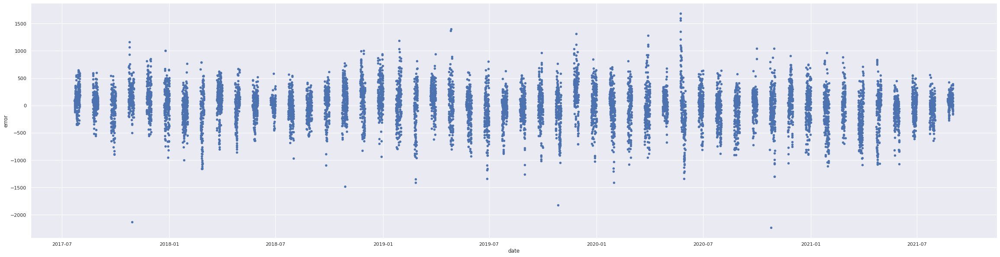

In [163]:
# Plot validation set error
dataSet['error']= preds - y_valid

sns.set()
%matplotlib inline
dataSet.plot.scatter(x='date', y='error', figsize=(40, 10))

In [164]:
dataSet['error'].describe()

count    10152.000000
mean        -2.123395
std        326.020843
min      -2231.243750
25%       -182.201250
50%         30.358125
75%        189.344062
max       1681.253750
Name: error, dtype: float64

 Errors on the validation set accross the last 3 years are quite uniform , except around April 2020 when lockdown was introduced and usage patterns understandbly changed dramatically!


In [165]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Wind"))

fig.add_trace(go.Scatter(x=dataSet['date'], y=dataSet['ForecastWndMW'],
                    mode='lines',
                    name='Eirgrid Forecast Wnd',showlegend=True), 1, 1, secondary_y=False)

#fig.add_trace(go.Scatter(x=dataSet['date'], y=dataSet['ActualDemandMW'],
#                    mode='lines',
#                    name='Demand Actual',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=dataSet['date'], y=dataSet['ActualWindMW'],
                    mode='lines',
                    name='Wind Actual',showlegend=True), 1, 1, secondary_y=False)


fig.add_trace(go.Scatter(x=dataSet['date'], y=(0.7*dataSet['ActualDemandMW']),
                         line=dict(color='firebrick', width=1, dash='dash'), # dash options include 'dash', 'dot', and 'dashdot'
                    name='70% Actual Demand',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=validSet['date'], y=preds,
                    line=dict(color='green', width=3),
                    name='Pred',showlegend=True), 1, 1, secondary_y=False)



fig.update_layout(
    title_text="Wind actual (blue) vs. Predictions (red) for days 22nd and above each month",
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=4000,
    height=500
)
fig.show()

## Metrics for last 2 weeks (Test set)

In [166]:
X_test_full.columns

Index(['wdsp_BEL', 'wddir_BEL', 'rhum_BEL', 'wdsp', 'wddir', 'rhum',
       'wdsp_COR', 'wddir_COR', 'rhum_COR', 'wdsp_DUB', 'wddir_DUB',
       'rhum_DUB', 'temp_DUB', 'radianTimeSin', 'radianTimeCos', 'hourSin',
       'hourCos', 'wdsp_MAL', 'wddir_MAL', 'rhum_MAL', 'TotalWindCapacityMW'],
      dtype='object')

In [167]:
X_train.columns

Index(['wdsp_BEL', 'wddir_BEL', 'rhum_BEL', 'wdsp', 'wddir', 'rhum',
       'wdsp_COR', 'wddir_COR', 'rhum_COR', 'wdsp_DUB', 'wddir_DUB',
       'rhum_DUB', 'temp_DUB', 'radianTimeSin', 'radianTimeCos', 'hourSin',
       'hourCos', 'wdsp_MAL', 'wddir_MAL', 'rhum_MAL', 'TotalWindCapacityMW'],
      dtype='object')

In [168]:
X_test_full

,wdsp_BEL,wddir_BEL,rhum_BEL,wdsp,wddir,rhum,wdsp_COR,wddir_COR,rhum_COR,wdsp_DUB,wddir_DUB,rhum_DUB,temp_DUB,radianTimeSin,radianTimeCos,hourSin,hourCos,wdsp_MAL,wddir_MAL,rhum_MAL,TotalWindCapacityMW
36889,2,20,95,4,250,96,8,320,97,2,140,92,14.7,-0.963662,-0.267123,0.258819,0.965926,5,180.0,96,5576.095
36890,4,340,96,4,240,97,7,320,94,2,80,95,14.2,-0.963854,-0.266432,0.500000,0.866025,5,210.0,96,5576.095
36891,4,340,95,3,220,96,6,320,94,3,90,97,14.1,-0.964045,-0.265741,0.707107,0.707107,5,160.0,97,5576.095
36892,2,280,95,4,240,93,6,320,94,2,110,97,13.7,-0.964235,-0.265049,0.866025,0.500000,4,190.0,97,5576.095
36893,3,290,95,4,260,94,5,320,95,1,110,96,13.3,-0.964425,-0.264357,0.965926,0.258819,3,190.0,97,5576.095
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37243,23,190,90,10,160,85,6,190,83,7,210,71,10.5,-0.999864,-0.016496,-0.965926,0.258819,9,170.0,76,5576.095
37244,25,180,89,10,140,90,9,190,85,7,200,70,10.8,-0.999876,-0.015779,-0.866025,0.500000,11,160.0,78,5576.095
37245,31,190,89,9,140,91,10,190,86,7,200,76,10.5,-0.999887,-0.015062,-0.707107,0.707107,15,170.0,74,5576.095
37246,31,190,93,9,140,93,12,190,84,8,200,74,10.6,-0.999897,-0.014345,-0.500000,0.866025,16,160.0,83,5576.095


In [169]:
# Preprocessing of validation data, get predictions
test_preds = clf.predict(X_test_full)

print('MAE:', mean_absolute_error(y_test, test_preds))
print('RMSE:', np.sqrt(mean_squared_error(y_test, test_preds))) 
print('Test r2_score:', r2_score(y_test, test_preds))
print('explained_variance_score:', explained_variance_score(y_test, test_preds))

MAE: 142.29357938718664
RMSE: 221.19545005295547
Test r2_score: 0.9143062539221287
explained_variance_score: 0.916218725910098


In [170]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Wind"))

fig.add_trace(go.Scatter(x=testSet['date'], y=testSet['ForecastWndMW'],
                    mode='lines',
                    name='Eirgrid Forecast Wnd',showlegend=True), 1, 1, secondary_y=False)

#fig.add_trace(go.Scatter(x=testSet['date'], y=testSet['ActualDemandMW'],
#                    mode='lines', name='Eirgrid Actual Demand',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=testSet['date'], y=(0.7*testSet['ActualDemandMW']),
                         line=dict(color='firebrick', width=1, dash='dash'), # dash options include 'dash', 'dot', and 'dashdot'
                    name='70% Actual Demand',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=testSet['date'], y=testSet['ActualWindMW'],
                    mode='lines',
                    name='Wind Actual',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=testSet['date'], y=test_preds,
                    mode='lines',
                    name='Pred',showlegend=True), 1, 1, secondary_y=False)


fig.update_layout(
    title_text="Wind actual (blue) vs. Predictions (red) for last 2 weeks (test set)",
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=1400,
    height=800
)
fig.show()

In [171]:

df_results['N/A', 'Eirgrid']['Test MAE'] = mean_absolute_error(testSet.ActualWindMW, testSet.ForecastWndMW) 
df_results['N/A', 'Eirgrid']['Test RMSE'] = np.sqrt(mean_squared_error(testSet.ActualWindMW, testSet.ForecastWndMW)) 
df_results['N/A', 'Eirgrid']['Test explained_variance_score'] = explained_variance_score(testSet.ActualWindMW, testSet.ForecastWndMW)

print("---------------------")

df_results[attrSet_name, 'Random Forest']['Test MAE'] = mean_absolute_error(testSet.ActualWindMW, test_preds ) 
df_results[attrSet_name, 'Random Forest']['Test RMSE'] = np.sqrt(mean_squared_error(testSet.ActualWindMW, test_preds)) 
df_results[attrSet_name, 'Random Forest']['Test explained_variance_score'] = explained_variance_score(testSet.ActualWindMW, test_preds)


df_results

---------------------


,"(time & rhum, Random Forest)","(N/A, Eirgrid)"
attrSet,time & rhum,N/A
algorithm,Random Forest,Eirgrid
Valid MAE,244.931,214.395
Valid RMSE,326.012,346.982
Valid explained_variance_score,0.882922,0.869875
Test MAE,142.294,177.152
Test RMSE,221.195,221.721
Test explained_variance_score,0.916219,0.914759


## Model features importance

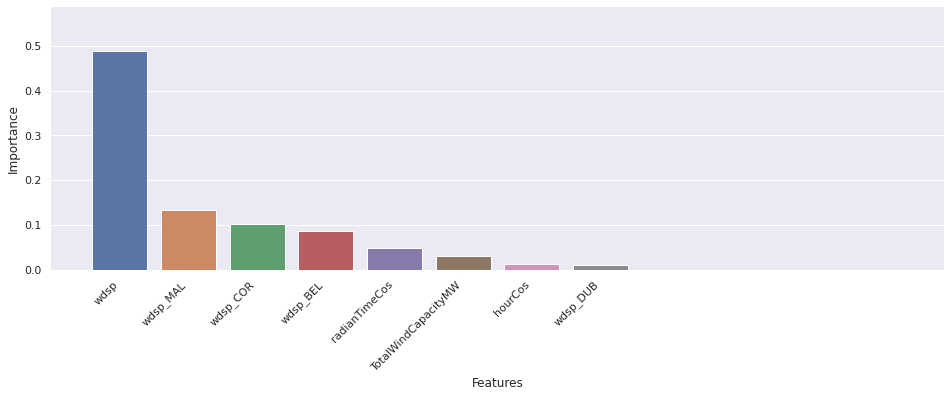

In [172]:
X_cols = X_valid.columns

rfc_fi = pd.DataFrame({'cols':X_cols, 'imp':model.feature_importances_}
                       ).sort_values('imp', ascending=False)

f, ax = plt.subplots(figsize=(16, 5))

chart = sns.barplot(x="cols", y="imp", data=(rfc_fi.loc[rfc_fi.imp > 0.01]))

# Add a legend and informative axis label
ax.set(xlim=(-1, 12), ylabel="Importance",
       xlabel="Features")
sns.despine(left=True, bottom=True)
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')

# Pad margins so that markers don't get clipped by the axes
plt.margins(0.2)
# Tweak spacing to prevent clipping of tick-labels
plt.subplots_adjust(bottom=0.15)
plt.show()

In [173]:
rfc_fi

,cols,imp
3,wdsp,0.489175
17,wdsp_MAL,0.133695
6,wdsp_COR,0.102270
0,wdsp_BEL,0.086174
14,radianTimeCos,0.048158
20,TotalWindCapacityMW,0.030346
16,hourCos,0.011961
9,wdsp_DUB,0.011764
8,rhum_COR,0.009896
13,radianTimeSin,0.008490


# Met Éireann Weather Forecast API
Published by: Met Éireann
 32 
Licensed under: Met Eireann Custom Open Data Licence
https://data.gov.ie/dataset/met-eireann-weather-forecast-api/resource/027da6d5-d819-48d1-9b16-331dba169bd1

In [174]:

from xml.dom.minidom import parse
import xml.dom.minidom


In [175]:
def getWeather(lat, long, name):

    url = "http://metwdb-openaccess.ichec.ie/metno-wdb2ts/locationforecast?lat={};long={}".format(lat, long)
    s = requests.get(url).content

    DOMTree = xml.dom.minidom.parse(io.StringIO(s.decode('utf-8')))

    collection = DOMTree.documentElement
    if collection.hasAttribute("shelf"):
       print ("Root element : ", collection.getAttribute("shelf"))

    # Get all the movies in the collection
    product = collection.getElementsByTagName("product")

    df_cols = ['date', 'wddir', 'wdsp', 'temp', 'msl', 'rhum']
    rows = []

    product = collection.getElementsByTagName("product")
    timefcs = collection.getElementsByTagName("time")


    # Print detail of each movie.
    for timefc in timefcs:
        if timefc.hasAttribute("from"):
            fromtime =""
            wdeg = None
            wsp = None
            temp = None
            msl = None
            rhum = None

            #print ("from: ", timefc.getAttribute("from"))
            fromtime = timefc.getAttribute("from")

            location = timefc.getElementsByTagName('location')[0]

            if (len(location.getElementsByTagName('windDirection')) > 0 ):
                wd = location.getElementsByTagName('windDirection')[0]
                if wd.hasAttribute("deg"):
                    wdeg = float(wd.getAttribute("deg"))
                    #print ("Wi)nd Direction deg: ", wd.getAttribute("deg"))    

            if (len(location.getElementsByTagName('windSpeed')) > 0):
                wsp = location.getElementsByTagName('windSpeed')[0]
                if wsp.hasAttribute("mps"):
                    wsp = float(wsp.getAttribute("mps"))

            if (len(location.getElementsByTagName('pressure')) > 0):
                msl = location.getElementsByTagName('pressure')[0]
                if msl.hasAttribute("value"):
                    msl = float(msl.getAttribute("value"))

            if (len(location.getElementsByTagName('humidity')) > 0):
                rhum = location.getElementsByTagName('humidity')[0]
                if rhum.hasAttribute("value"):
                    rhum = float(rhum.getAttribute("value"))

            if (len(location.getElementsByTagName('temperature')) > 0):
                temp = location.getElementsByTagName('temperature')[0]
                if temp.hasAttribute("value"):
                    temp = float(temp.getAttribute("value"))
        #print ("From: " + fromtime + " Wind Direction deg: " + str(wdeg) + " Wind Speed mps: " + str(wsp))    
        if (wdeg != None):
            rows.append({"date": fromtime, "wddir": wdeg, "wdsp": wsp, "temp": temp, "msl": msl, "rhum": rhum})


    # <windDirection id="dd" deg="348.0" name="N"/>
    # <windSpeed id="ff" mps="3.2" beaufort="2" name="Svak vind"/>


    out_df = pd.DataFrame(rows, columns = df_cols)
    
    out_df["date"] = pd.to_datetime(out_df["date"], infer_datetime_format=True, errors='ignore')

    #out_df.to_csv(name + "weather.csv")

    return out_df

In [176]:
# Belmullet: 54.225, -9.991
lat=54.225
long=-9.991

BELMULLETds = getWeather(lat, long, "Belmullet")

In [177]:
# Cork Airport: 51.8382 Longitude: -8.4880
lat= 51.8382
long= -8.4880

corkairportds = getWeather(lat, long, "Cork")

In [178]:
# Shannon Airport, Ireland. Latitude: 52.7012 Longitude: -8.9215.
lat= 52.7012
long= -8.9215

shannonairportds = getWeather(lat, long, "Shannon")

In [179]:
# Dublin Airport in Ireland. Latitude: 53.4264 Longitude: -6.2499
lat= 53.4264
long= -6.2499

dublinairportds = getWeather(lat, long, "Dublin")

In [180]:
# Malin Head:  55.3833318 -7.3666652
lat=55.3833318
long=-7.3666652

MALds = getWeather(lat, long, "Malin Head")

In [181]:
left = BELMULLETds.set_index(['date']).copy()
right = dublinairportds.set_index(['date'])
#right.index = right.index.tz_convert(None)

wfds = left.join(right, lsuffix="_BEL", rsuffix="_DUB")

right = shannonairportds.set_index(['date'])
wfds = wfds.join(right, lsuffix="", rsuffix="_SHA")

right = corkairportds.set_index(['date'])
wfds = wfds.join(right, lsuffix="", rsuffix="_COR")

right = MALds.set_index(['date'])
wfds = wfds.join(right, lsuffix="", rsuffix="_MAL")

wfds = wfds.reset_index()


In [182]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Met Station"))


fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_BEL'],
                    mode='lines',
                    name='Belmullet Wind Speed',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_COR'],
                    mode='lines',
                    name='Cork Airport Wind Speed',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp'],
                    mode='lines',
                    name='Shannon Airport Wind Speed',showlegend=True), 1, 1, secondary_y=False)
fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_DUB'],
                    mode='lines',
                    name='Dublin Airport Wind Speed',showlegend=True), 1, 1, secondary_y=False)
fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_MAL'],
                    mode='lines',
                    name='Malin head Wind Speed',showlegend=True), 1, 1, secondary_y=False)

fig.update_layout(
    title_text="Wind speed ",
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=1400,
    height=500
)
fig.show()

In [183]:
# Weather Hourly data wind speed in knt, for some reason, 1 knt = 0.514 m/s
knot = 0.514
wfds.wdsp_BEL = wfds.wdsp_BEL / knot
wfds.wdsp = wfds.wdsp / knot
wfds.wdsp_COR = wfds.wdsp_COR / knot
wfds.wdsp_DUB = wfds.wdsp_DUB / knot
wfds.wdsp_MAL = wfds.wdsp_MAL / knot

In [184]:
fig = go.Figure()
fig.add_trace(go.Box(y=newdf['wdsp_BEL'], name='BEL'))
fig.add_trace(go.Box(y=wfds['wdsp_BEL'], name='BEL forecast'))
fig.add_trace(go.Box(y=newdf['wdsp_DUB'], name = 'DUB'))
fig.add_trace(go.Box(y=wfds['wdsp_DUB'], name='DUB forecast'))
fig.add_trace(go.Box(y=newdf['wdsp'], name = 'SHA'))
fig.add_trace(go.Box(y=wfds['wdsp'], name='SHA forecast'))

fig.add_trace(go.Box(y=newdf['wdsp_COR'], name = 'CORK'))
fig.add_trace(go.Box(y=wfds['wdsp_COR'], name='CORK forecast'))

fig.add_trace(go.Box(y=newdf['wdsp_MAL'], name = 'MALIN Head'))
fig.add_trace(go.Box(y=wfds['wdsp_MAL'], name='Malin forecast'))
fig.show()

In [185]:
fig = go.Figure()
fig.add_trace(go.Box(y=newdf['rhum_BEL'], name='BEL'))
fig.add_trace(go.Box(y=wfds['rhum_BEL'], name='BEL forecast'))
fig.add_trace(go.Box(y=newdf['rhum_DUB'], name = 'DUB'))
fig.add_trace(go.Box(y=wfds['rhum_DUB'], name='DUB forecast'))
fig.add_trace(go.Box(y=newdf['rhum'], name = 'SHA'))
fig.add_trace(go.Box(y=wfds['rhum'], name='SHA forecast'))

fig.add_trace(go.Box(y=newdf['rhum_COR'], name = 'CORK'))
fig.add_trace(go.Box(y=wfds['rhum_COR'], name='CORK forecast'))

fig.add_trace(go.Box(y=newdf['rhum_MAL'], name = 'MALIN Head'))
fig.add_trace(go.Box(y=wfds['rhum_MAL'], name='Malin forecast'))
fig.show()

# Run predictions 

In [186]:
wfds.columns

Index(['date', 'wddir_BEL', 'wdsp_BEL', 'temp_BEL', 'msl_BEL', 'rhum_BEL',
       'wddir_DUB', 'wdsp_DUB', 'temp_DUB', 'msl_DUB', 'rhum_DUB', 'wddir',
       'wdsp', 'temp', 'msl', 'rhum', 'wddir_COR', 'wdsp_COR', 'temp_COR',
       'msl_COR', 'rhum_COR', 'wddir_MAL', 'wdsp_MAL', 'temp_MAL', 'msl_MAL',
       'rhum_MAL'],
      dtype='object')

In [187]:
X_train.columns

Index(['wdsp_BEL', 'wddir_BEL', 'rhum_BEL', 'wdsp', 'wddir', 'rhum',
       'wdsp_COR', 'wddir_COR', 'rhum_COR', 'wdsp_DUB', 'wddir_DUB',
       'rhum_DUB', 'temp_DUB', 'radianTimeSin', 'radianTimeCos', 'hourSin',
       'hourCos', 'wdsp_MAL', 'wddir_MAL', 'rhum_MAL', 'TotalWindCapacityMW'],
      dtype='object')

In [188]:
wfds["hour"] = 0
wfds["isweekday"] = False
wfds["month"] = 0
wfds['year'] = 0
wfds["day"] = 0
wfds['TotalWindCapacityMW'] = latestWindCapacityMW
def settimeattfull(row):
    row["hour"] = row.date.hour
    row["isweekday"] = (row.date.isoweekday() < 6) 
    row["month"] = row.date.month
    row["year"] = row.date.year
    row["day"] = row.date.day
    return row

wfds = wfds.apply(settimeattfull, axis='columns')

In [189]:
wfds = transformTimeInto2d(wfds)
wfds.columns

Index(['date', 'wddir_BEL', 'wdsp_BEL', 'temp_BEL', 'msl_BEL', 'rhum_BEL',
       'wddir_DUB', 'wdsp_DUB', 'temp_DUB', 'msl_DUB', 'rhum_DUB', 'wddir',
       'wdsp', 'temp', 'msl', 'rhum', 'wddir_COR', 'wdsp_COR', 'temp_COR',
       'msl_COR', 'rhum_COR', 'wddir_MAL', 'wdsp_MAL', 'temp_MAL', 'msl_MAL',
       'rhum_MAL', 'hour', 'isweekday', 'month', 'year', 'day',
       'TotalWindCapacityMW', 'Day_inYear', 'daysInYear', 'radianTime',
       'radianTimeCos', 'radianTimeSin', 'hourCos', 'hourSin'],
      dtype='object')

In [190]:
wfds = transformWindInto2d(wfds)
wfds.columns

Index(['date', 'wddir_BEL', 'wdsp_BEL', 'temp_BEL', 'msl_BEL', 'rhum_BEL',
       'wddir_DUB', 'wdsp_DUB', 'temp_DUB', 'msl_DUB', 'rhum_DUB', 'wddir',
       'wdsp', 'temp', 'msl', 'rhum', 'wddir_COR', 'wdsp_COR', 'temp_COR',
       'msl_COR', 'rhum_COR', 'wddir_MAL', 'wdsp_MAL', 'temp_MAL', 'msl_MAL',
       'rhum_MAL', 'hour', 'isweekday', 'month', 'year', 'day',
       'TotalWindCapacityMW', 'Day_inYear', 'daysInYear', 'radianTime',
       'radianTimeCos', 'radianTimeSin', 'hourCos', 'hourSin', 'wind_CORsin',
       'wind_CORcos', 'wind_DUBsin', 'wind_DUBcos', 'wind_BELsin',
       'wind_BELcos', 'windsin', 'windcos', 'wind_MALsin', 'wind_MALcos'],
      dtype='object')

In [191]:
redtds = wfds.loc[ : , attrSet]


In [192]:
redtds

,wdsp_BEL,wddir_BEL,rhum_BEL,wdsp,wddir,rhum,wdsp_COR,wddir_COR,rhum_COR,wdsp_DUB,wddir_DUB,rhum_DUB,temp_DUB,radianTimeSin,radianTimeCos,hourSin,hourCos,wdsp_MAL,wddir_MAL,rhum_MAL,TotalWindCapacityMW
0,5.447471,227.0,79.3,3.307393,256.3,73.5,4.474708,355.7,72.7,8.171206,307.3,73.6,15.9,-0.979325,0.202296,-5.000000e-01,-8.660254e-01,14.202335,293.5,96.4,5576.095
1,4.863813,227.1,78.0,2.918288,247.1,72.5,4.474708,356.4,72.9,6.809339,296.7,76.0,15.4,-0.979179,0.202998,-7.071068e-01,-7.071068e-01,14.785992,294.9,93.8,5576.095
2,4.863813,222.6,79.1,1.945525,283.9,72.3,3.891051,6.6,73.7,7.198444,300.2,79.4,14.9,-0.979033,0.203700,-8.660254e-01,-5.000000e-01,14.591440,296.2,93.3,5576.095
3,3.307393,227.7,86.7,1.945525,279.2,74.5,3.307393,11.8,74.9,6.809339,291.6,82.3,14.2,-0.978887,0.204402,-9.659258e-01,-2.588190e-01,13.618677,292.7,92.7,5576.095
4,3.112840,245.0,89.9,2.918288,241.9,76.6,3.696498,7.0,76.2,5.642023,290.1,86.1,12.9,-0.978740,0.205104,-1.000000e+00,-1.836970e-16,13.618677,286.5,91.7,5576.095
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,4.280156,26.0,80.9,7.392996,340.5,91.0,7.198444,328.3,92.5,3.307393,318.3,93.2,11.4,-0.939856,0.341571,0.000000e+00,1.000000e+00,8.754864,358.7,75.2,5576.095
107,14.785992,19.0,89.9,5.642023,340.5,92.0,9.727626,344.4,92.7,9.143969,314.0,92.8,10.7,-0.938377,0.345612,1.000000e+00,6.123234e-17,13.813230,4.4,90.1,5576.095
108,24.319066,13.8,72.8,9.727626,347.5,81.8,11.089494,342.0,77.7,10.116732,323.7,90.5,10.6,-0.936881,0.349647,1.224647e-16,-1.000000e+00,29.182879,12.7,85.8,5576.095
109,24.513619,9.8,67.3,14.980545,348.3,74.3,14.785992,337.6,77.2,16.926070,351.9,89.4,10.1,-0.935368,0.353676,-1.000000e+00,-1.836970e-16,27.626459,12.0,77.4,5576.095


In [193]:
redtds.columns

Index(['wdsp_BEL', 'wddir_BEL', 'rhum_BEL', 'wdsp', 'wddir', 'rhum',
       'wdsp_COR', 'wddir_COR', 'rhum_COR', 'wdsp_DUB', 'wddir_DUB',
       'rhum_DUB', 'temp_DUB', 'radianTimeSin', 'radianTimeCos', 'hourSin',
       'hourCos', 'wdsp_MAL', 'wddir_MAL', 'rhum_MAL', 'TotalWindCapacityMW'],
      dtype='object')

In [194]:
X_valid.columns

Index(['wdsp_BEL', 'wddir_BEL', 'rhum_BEL', 'wdsp', 'wddir', 'rhum',
       'wdsp_COR', 'wddir_COR', 'rhum_COR', 'wdsp_DUB', 'wddir_DUB',
       'rhum_DUB', 'temp_DUB', 'radianTimeSin', 'radianTimeCos', 'hourSin',
       'hourCos', 'wdsp_MAL', 'wddir_MAL', 'rhum_MAL', 'TotalWindCapacityMW'],
      dtype='object')

In [195]:
redtds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 111 entries, 0 to 110
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   wdsp_BEL             111 non-null    float64
 1   wddir_BEL            111 non-null    float64
 2   rhum_BEL             111 non-null    float64
 3   wdsp                 111 non-null    float64
 4   wddir                111 non-null    float64
 5   rhum                 111 non-null    float64
 6   wdsp_COR             111 non-null    float64
 7   wddir_COR            111 non-null    float64
 8   rhum_COR             111 non-null    float64
 9   wdsp_DUB             111 non-null    float64
 10  wddir_DUB            111 non-null    float64
 11  rhum_DUB             111 non-null    float64
 12  temp_DUB             111 non-null    float64
 13  radianTimeSin        111 non-null    float64
 14  radianTimeCos        111 non-null    float64
 15  hourSin              111 non-null    flo

In [196]:
X_valid.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10152 entries, 528 to 36551
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   wdsp_BEL             10152 non-null  int64  
 1   wddir_BEL            10152 non-null  int64  
 2   rhum_BEL             10152 non-null  int64  
 3   wdsp                 10152 non-null  int64  
 4   wddir                10152 non-null  int64  
 5   rhum                 10152 non-null  int64  
 6   wdsp_COR             10152 non-null  int64  
 7   wddir_COR            10152 non-null  int64  
 8   rhum_COR             10152 non-null  int64  
 9   wdsp_DUB             10152 non-null  int64  
 10  wddir_DUB            10152 non-null  int64  
 11  rhum_DUB             10152 non-null  int64  
 12  temp_DUB             10152 non-null  float64
 13  radianTimeSin        10152 non-null  float64
 14  radianTimeCos        10152 non-null  float64
 15  hourSin              10152 non-nul

In [197]:

# Preprocessing of validation data, get predictions
preds = clf.predict(redtds)

In [198]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Met Station"))


fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_BEL'],
                    mode='lines',
                    name='Belmullet Wind Speed',showlegend=True), 1, 1, secondary_y=False)


fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_MAL'],
                    mode='lines',
                    name='Malin Head Wind Speed',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=wfds['date'], y=preds,
                    mode='lines', 
                    name='Wind Preds',showlegend=True), 1, 1, secondary_y=True)

fig.update_layout(
    title_text="Wind speed ",
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=1400,
    height=500
)
fig.update_layout(coloraxis=dict(colorscale='Bluered_r'), showlegend=True)
fig.show()

In [199]:
preds

array([ 174.38125,  257.8    ,  251.75625,  207.205  ,  274.8675 ,
        284.11   ,  257.6175 ,  262.8575 ,  240.425  ,  270.48375,
        249.34625,  280.3975 ,  329.98125,  350.58375,  464.15625,
        561.49375,  542.1325 ,  555.61   ,  489.03625,  469.045  ,
        515.52125,  515.8275 ,  494.53875,  760.5125 ,  957.74375,
       1071.87375,  696.865  , 1213.9325 ,  668.88375, 1359.79875,
       1281.64875, 1273.25125, 1226.03625, 1017.60125, 1250.94125,
       1485.385  , 1417.45875, 1417.72125, 1451.29   , 1657.545  ,
       1621.285  , 1706.1075 , 1771.09625, 1775.10875, 1771.225  ,
       1881.1675 , 1881.275  , 1694.705  , 1788.8575 , 1803.995  ,
       1550.07125, 1335.15625,  952.44375,  757.645  ,  823.28   ,
        936.31625,  660.73125,  634.95   ,  624.76625,  625.93   ,
        619.10125,  564.62875,  515.36   ,  467.49875,  384.1975 ,
        358.62   ,  365.8225 ,  309.83   ,  318.94125,  282.75625,
        266.51625,  194.0325 ,  140.88875,  144.71625,  195.97

In [200]:
forecast = wfds.copy()
#forecast['date'] = wfds['date']
forecast['RF_Preds']=preds

forecast.head(24)

,date,wddir_BEL,wdsp_BEL,temp_BEL,msl_BEL,rhum_BEL,wddir_DUB,wdsp_DUB,temp_DUB,msl_DUB,rhum_DUB,wddir,wdsp,temp,msl,rhum,wddir_COR,wdsp_COR,temp_COR,msl_COR,rhum_COR,wddir_MAL,wdsp_MAL,temp_MAL,msl_MAL,rhum_MAL,hour,isweekday,month,year,day,TotalWindCapacityMW,Day_inYear,daysInYear,radianTime,radianTimeCos,radianTimeSin,hourCos,hourSin,wind_CORsin,wind_CORcos,wind_DUBsin,wind_DUBcos,wind_BELsin,wind_BELcos,windsin,windcos,wind_MALsin,wind_MALcos,RF_Preds
0,2021-10-12 14:00:00,227.0,5.447471,14.6,1029.3,79.3,307.3,8.171206,15.9,1028.0,73.6,256.3,3.307393,14.6,1029.5,73.5,355.7,4.474708,15.3,1029.1,72.7,293.5,14.202335,13.8,1027.5,96.4,14,True,10,2021,12,5576.095,285,365,4.916090,0.202296,-0.979325,-8.660254e-01,-5.000000e-01,-2.882789,-3.422359,-4.451190,6.852410,3.927946,3.774411,-3.196062,0.850902,-13.798928,-3.360936,174.38125
1,2021-10-12 15:00:00,227.1,4.863813,14.6,1029.3,78.0,296.7,6.809339,15.4,1028.0,76.0,247.1,2.918288,14.8,1029.2,72.5,356.4,4.474708,15.2,1028.9,72.9,294.9,14.785992,13.8,1027.8,93.8,15,True,10,2021,12,5576.095,285,365,4.916808,0.202998,-0.979179,-7.071068e-01,-7.071068e-01,-4.409623,-0.760420,6.698707,1.222461,3.826013,3.003049,2.581768,-1.360470,-5.889894,13.562253,257.80000
2,2021-10-12 16:00:00,222.6,4.863813,14.3,1029.2,79.1,300.2,7.198444,14.9,1028.2,79.4,283.9,1.945525,14.7,1029.2,72.3,6.6,3.891051,14.9,1028.8,73.7,296.2,14.591440,13.5,1028.0,93.3,16,True,10,2021,12,5576.095,285,365,4.917525,0.203700,-0.979033,-5.000000e-01,-8.660254e-01,1.212223,3.697403,-7.084832,1.273870,2.129063,-4.373073,1.781060,0.782876,11.341264,9.180733,251.75625
3,2021-10-12 17:00:00,227.7,3.307393,13.5,1029.3,86.7,291.6,6.809339,14.2,1028.2,82.3,279.2,1.945525,14.2,1029.4,74.5,11.8,3.307393,14.3,1029.2,74.9,292.7,13.618677,13.3,1028.0,92.7,17,True,10,2021,12,5576.095,285,365,4.918242,0.204402,-0.978887,-2.588190e-01,-9.659258e-01,-2.293760,2.382753,3.663735,-5.739699,3.300308,0.216372,0.760751,-1.790622,-6.906811,-11.737305,207.20500
4,2021-10-12 18:00:00,245.0,3.112840,13.0,1029.2,89.9,290.1,5.642023,12.9,1028.3,86.1,241.9,2.918288,13.6,1029.4,76.6,7.0,3.696498,13.7,1029.3,76.2,286.5,13.618677,13.0,1028.1,91.7,18,True,10,2021,12,5576.095,285,365,4.918959,0.205104,-0.978740,-1.836970e-16,-1.000000e+00,2.428550,2.786798,4.958571,2.691653,-0.137627,3.109797,0.007688,-2.918278,-7.858174,-11.122835,274.86750
5,2021-10-12 19:00:00,275.9,2.140078,12.7,1029.0,92.3,285.9,6.031128,12.8,1028.5,86.2,256.1,2.140078,13.1,1029.3,80.5,26.9,1.945525,13.2,1029.3,78.2,274.0,12.840467,12.9,1028.1,90.2,19,True,10,2021,12,5576.095,285,365,4.919677,0.205806,-0.978593,2.588190e-01,-9.659258e-01,1.908100,-0.379769,-0.090877,-6.030444,-1.137058,1.813017,-2.136201,0.128752,-8.088357,-9.972767,284.11000
6,2021-10-12 20:00:00,171.0,2.529183,12.4,1028.9,94.5,273.9,4.474708,11.9,1028.5,90.3,14.6,1.361868,11.6,1029.1,88.7,181.8,1.361868,12.6,1029.2,83.9,263.6,12.062257,12.8,1028.0,90.3,20,True,10,2021,12,5576.095,285,365,4.920394,0.206508,-0.978445,5.000000e-01,-8.660254e-01,-0.545817,1.247705,-2.457631,-3.739393,2.469977,0.544041,1.218587,-0.608053,-3.492929,11.545453,257.61750
7,2021-10-12 21:00:00,214.3,3.112840,12.3,1029.0,94.2,267.6,3.501946,11.0,1028.6,92.3,28.4,1.361868,10.6,1029.1,89.0,243.2,2.140078,12.0,1029.1,89.2,265.6,13.035019,12.7,1028.1,87.3,21,True,10,2021,12,5576.095,285,365,4.921111,0.207210,-0.978296,7.071068e-01,-7.071068e-01,-2.060574,-0.577899,-1.873886,-2.958407,1.937174,2.436623,-0.170691,-1.351129,12.915679,-1.759822,262.85750
8,2021-10-12 22:00:00,213.7,3.696498,12.2,1029.0,91.8,277.9,3.307393,10.5,1028.8,93.3,57.9,1.945525,9.7,1029.1,89.0,309.6,1.750973,11.9,1029.0,89.0,266.1,14.007782,12.8,1028.3,85.3,22,True,10,2021,12,5576.095,285,365,4.921828,0.207912,-0.978148,8.660254e-01,-5.000000e-01,1.730485,-0.267069,3.279076,0.431866,0.264810,3.687001,1.898860,0.423554,11.273772,-8.313846,240.42500
9,2021-10-12 23:00:00,220.2,3.696498,12.2,1029.1,88.4,313.1,5.642023,10.6,1029.0,95.1,76.7,0.972763,10.0,1029.5,91.4,317.1,2.33463

In [201]:
def getCurrentEirgridWindPrediction(): 
  #url_base = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom='
  url_base = 'https://www.smartgriddashboard.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom='
  url_mid = '%2000:00&dateto='
  url_end = '%2023:59'

  now = datetime.now()
  yesterday = now - timedelta(days=1)
  tomorrow = now + timedelta(days=1)

  date_time = yesterday.strftime("%d-%b-%Y")
  tom_date_time = tomorrow.strftime("%d-%b-%Y") 
  #print("Date and Time:",date_time)
  url = url_base + date_time + url_mid + tom_date_time + url_end
  print(url)

  s = requests.get(url).content
  mds = pd.read_csv(io.StringIO(s.decode('utf-8')), na_values='-')
  mds['date'] = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore')
  mds = mds.rename(columns={' FORECAST WIND(MW)' : 'ForecastWndMW'})
  mds = mds.rename(columns={' ACTUAL GENERATION(MW)' : 'ActualGenerationMW'})
  mds.drop('DATE & TIME', axis=1, inplace=True)
  mds.drop(' REGION', axis=1, inplace=True)

  return mds


In [202]:
def getCurrentEirgridDemandPrediction(): 
  #url_base = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=demandActual&region=ALL&datefrom='
  url_base = 'https://www.smartgriddashboard.com/DashboardService.svc/csv?area=demandActual&region=ALL&datefrom='
  url_mid = '%2000:00&dateto='
  url_end = '%2023:59'

  now = datetime.now()
  yesterday = now - timedelta(days=1)
  tomorrow = now + timedelta(days=1)

  date_time = yesterday.strftime("%d-%b-%Y")
  tom_date_time = tomorrow.strftime("%d-%b-%Y") 
  #print("Date and Time:",date_time)
  url = url_base + date_time + url_mid + tom_date_time + url_end
  print(url)

  s = requests.get(url).content
  mds = pd.read_csv(io.StringIO(s.decode('utf-8')), na_values='-')
  mds['date'] = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore')

  mds = mds.rename(columns={' ACTUAL DEMAND(MW)' : 'ActualDemandMW'})
  mds = mds.rename(columns={' FORECAST DEMAND(MW)' : 'ForecastDemandMW'})
  mds.drop('DATE & TIME', axis=1, inplace=True)
  mds.drop(' REGION', axis=1, inplace=True)

  return mds


In [203]:
eds = getCurrentEirgridDemandPrediction()

left = forecast.set_index(['date'])
right = eds.set_index(['date'])
forecast = left.join(right)

https://www.smartgriddashboard.com/DashboardService.svc/csv?area=demandActual&region=ALL&datefrom=11-Oct-2021%2000:00&dateto=13-Oct-2021%2023:59


In [204]:
mds = getCurrentEirgridWindPrediction()

right = mds.set_index(['date'])
forecast = forecast.join(right)

https://www.smartgriddashboard.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=11-Oct-2021%2000:00&dateto=13-Oct-2021%2023:59


In [205]:
forecast

,wddir_BEL,wdsp_BEL,temp_BEL,msl_BEL,rhum_BEL,wddir_DUB,wdsp_DUB,temp_DUB,msl_DUB,rhum_DUB,wddir,wdsp,temp,msl,rhum,wddir_COR,wdsp_COR,temp_COR,msl_COR,rhum_COR,wddir_MAL,wdsp_MAL,temp_MAL,msl_MAL,rhum_MAL,hour,isweekday,month,year,day,TotalWindCapacityMW,Day_inYear,daysInYear,radianTime,radianTimeCos,radianTimeSin,hourCos,hourSin,wind_CORsin,wind_CORcos,wind_DUBsin,wind_DUBcos,wind_BELsin,wind_BELcos,windsin,windcos,wind_MALsin,wind_MALcos,RF_Preds,ActualDemandMW,ForecastDemandMW,ForecastWndMW,ACTUAL WIND(MW)
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-10-12 14:00:00,227.0,5.447471,14.6,1029.3,79.3,307.3,8.171206,15.9,1028.0,73.6,256.3,3.307393,14.6,1029.5,73.5,355.7,4.474708,15.3,1029.1,72.7,293.5,14.202335,13.8,1027.5,96.4,14,True,10,2021,12,5576.095,285,365,4.916090,0.202296,-0.979325,-8.660254e-01,-5.000000e-01,-2.882789,-3.422359,-4.451190,6.852410,3.927946,3.774411,-3.196062,0.850902,-13.798928,-3.360936,174.38125,5102.0,NaN,208.0,318.0
2021-10-12 15:00:00,227.1,4.863813,14.6,1029.3,78.0,296.7,6.809339,15.4,1028.0,76.0,247.1,2.918288,14.8,1029.2,72.5,356.4,4.474708,15.2,1028.9,72.9,294.9,14.785992,13.8,1027.8,93.8,15,True,10,2021,12,5576.095,285,365,4.916808,0.202998,-0.979179,-7.071068e-01,-7.071068e-01,-4.409623,-0.760420,6.698707,1.222461,3.826013,3.003049,2.581768,-1.360470,-5.889894,13.562253,257.80000,NaN,5018.0,174.0,NaN
2021-10-12 16:00:00,222.6,4.863813,14.3,1029.2,79.1,300.2,7.198444,14.9,1028.2,79.4,283.9,1.945525,14.7,1029.2,72.3,6.6,3.891051,14.9,1028.8,73.7,296.2,14.591440,13.5,1028.0,93.3,16,True,10,2021,12,5576.095,285,365,4.917525,0.203700,-0.979033,-5.000000e-01,-8.660254e-01,1.212223,3.697403,-7.084832,1.273870,2.129063,-4.373073,1.781060,0.782876,11.341264,9.180733,251.75625,NaN,5107.0,151.0,NaN
2021-10-12 17:00:00,227.7,3.307393,13.5,1029.3,86.7,291.6,6.809339,14.2,1028.2,82.3,279.2,1.945525,14.2,1029.4,74.5,11.8,3.307393,14.3,1029.2,74.9,292.7,13.618677,13.3,1028.0,92.7,17,True,10,2021,12,5576.095,285,365,4.918242,0.204402,-0.978887,-2.588190e-01,-9.659258e-01,-2.293760,2.382753,3.663735,-5.739699,3.300308,0.216372,0.760751,-1.790622,-6.906811,-11.737305,207.20500,NaN,5366.0,130.0,NaN
2021-10-12 18:00:00,245.0,3.112840,13.0,1029.2,89.9,290.1,5.642023,12.9,1028.3,86.1,241.9,2.918288,13.6,1029.4,76.6,7.0,3.696498,13.7,1029.3,76.2,286.5,13.618677,13.0,1028.1,91.7,18,True,10,2021,12,5576.095,285,365,4.918959,0.205104,-0.978740,-1.836970e-16,-1.000000e+00,2.428550,2.786798,4.958571,2.691653,-0.137627,3.109797,0.007688,-2.918278,-7.858174,-11.122835,274.86750,NaN,5485.0,122.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-21 00:00:00,26.0,4.280156,9.6,994.1,80.9,318.3,3.307393,11.4,990.2,93.2,340.5,7.392996,10.5,992.5,91.0,328.3,7.198444,10.4,991.6,92.5,358.7,8.754864,11.7,993.2,75.2,0,True,10,2021,21,5576.095,294,365,5.060977,0.341571,-0.939856,1.000000e+00,0.000000e+00,7.198398,-0.025682,-2.781541,-1.789379,3.263869,2.768915,6.911755,2.623745,4.638867,7.424860,734.89000,NaN,NaN,NaN,NaN
2021-10-21 06:00:00,19.0,14.785992,10.8,996.5,89.9,314.0,9.143969,10.7,992.3,92.8,340.5,5.642023,9.1,994.9,92.0,344.4,9.727626,9.5,993.5,92.7,4.4,13.813230,11.4,994.3,90.1,6,True,10,2021,21,5576.095,294,365,5.065280,0.345612,-0.938377,6.123234e-17,1.000000e+00,-8.976302,3.748697,-1.450169,9.028243,2.216083,14.618979,5.274760,2.002332,-13.144698,-4.245259,1177.25000,NaN,NaN,NaN,NaN
2021-10-21 12:00:00,13.8,24.319066,10.5,1002.3,72.8,323.7,10.116732,10.6,994.7,90.5,347.5,9.727626,12.5,997.6,81.8,342.0,11.089494,11.3,996.3,77.7,12.7,29.182879,10.7,998.8,85.8,12,True,10,2021,21,5576.095,294,365,5.069584,0.349647,-0.936881,-1.000000e+00,1.224647e-16,4.659137,-10.063266,-1.170475,-10.048793,22.949797,8.045109,9.124412,-3.372214,3.888095,28.922710,2157.25625,NaN,NaN,NaN,NaN


In [206]:
if not os.path.exists('forecast'):
  os.mkdir('forecast')

now = datetime.now()

forecast.to_csv("forecast/RF_forecast" + str(now) + ".csv")



In [207]:
if not os.path.exists('Results'):
  os.mkdir('Results')

df_results.to_csv("Results/RF" + str(now) + ".csv")
df_results

,"(time & rhum, Random Forest)","(N/A, Eirgrid)"
attrSet,time & rhum,N/A
algorithm,Random Forest,Eirgrid
Valid MAE,244.931,214.395
Valid RMSE,326.012,346.982
Valid explained_variance_score,0.882922,0.869875
Test MAE,142.294,177.152
Test RMSE,221.195,221.721
Test explained_variance_score,0.916219,0.914759


In [208]:
datetime.now()

datetime.datetime(2021, 10, 12, 13, 25, 41, 303317)